# Taxi Order Prediction Model

# Content <a id='back'></a>

* [1. Introduction](#intro)
* [2. Data Preparation](#data_prep)
    * [2.1 Initiation](#initiation)
    * [2.2 Load Data](#data_load)
    * [2.3 Missing Values](#missing)
* [3. Exploratory Data Analysis](#eda)
    * [3.1 Hourly Patters](#hp)
    * [3.2 Daily Pattern](#dp)
* [4. Train-Test Split](#split)
* [4. Modelling](#modelling)
    * [4.1 Liniear Regression](#lr)
    * [4.2 Prophet](#prophet)
* [Coclusions](#end)

## Introduction <a id='intro'></a>

A taxi company named Sweet Lift has collected historical data on taxi orders at the airport. To attract more drivers during peak hours, there is a need to predict the number of taxi orders for the next hour. Create a model for such predictions.

**Task** - build a predictive model for the next hour taxi order.

**Data Describtion** - The number of taxi order stored in `num_orders` column.

## Data Preparation <a id= 'data_prep'></a>

### Initiation <a id='initiation'></a>

In [ ]:
!pip install prophet

In [63]:
# Library pengolahan data
import numpy as np
import pandas as pd

# import time

# Library visualisasi
import matplotlib.pyplot as plt
import seaborn as sns

# Library sklearn
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

# Library Prophet
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

# Library statsmodel
from statsmodels.tools.eval_measures import rmse
from statsmodels.tsa.seasonal import seasonal_decompose

### Load Data <a id='initiation'></a>

In [18]:
# Load datasets
data = pd.read_csv('/datasets/taxi.csv')
data.head(5)

,datetime,num_orders
0,2018-03-01 00:00:00,9
1,2018-03-01 00:10:00,14
2,2018-03-01 00:20:00,28
3,2018-03-01 00:30:00,20
4,2018-03-01 00:40:00,32


In [19]:
data = data.rename(columns = {'datetime' : 'ds',
           'num_orders' : 'y'
                      })
data['ds'] = pd.to_datetime(data['ds'])
data.dtypes

ds    datetime64[ns]
y              int64
dtype: object

### Missing Values <a id='missing'></a>

In [20]:
# Check the percentages of missing values for each columns
(data.isnull().sum() / len(data)) * 100

ds    0.0
y     0.0
dtype: float64

## Exploratory Data Analysis <a id='eda'></a>

This section will conducted the breakdown of the data, including trend, seasonality, residual, and stationarity.

In [21]:
# Set resampling
hourly = data.set_index('ds').resample('H').sum()
daily = data.set_index('ds').resample('D').sum()

### Hourly Pattern <a id='hp'></a>

In [22]:
# Initiation of decomposed
decomposed = seasonal_decompose(hourly)

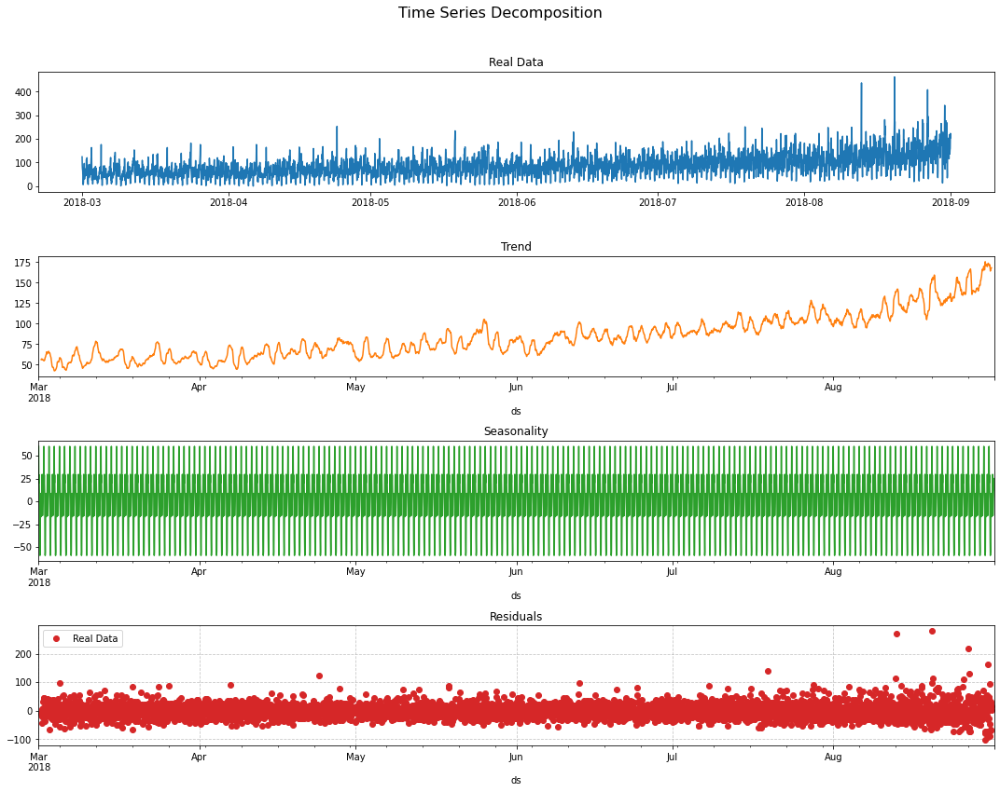

In [23]:
# Set a custom color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Set a custom line style for the Trend and Seasonality plots
line_styles = ['-', '--', '-', '--']

# Set a custom marker for the Residuals plot
marker_style = 'o'

# Create a figure with custom size
plt.figure(figsize=(15, 12))

# Real Data Plot
plt.subplot(411)
plt.plot(hourly, color=colors[0])
plt.title('Real Data')

# Trend Plot
plt.subplot(412)
decomposed.trend.plot(ax=plt.gca(), linestyle=line_styles[0], color=colors[1])
plt.title('Trend')

# Seasonality Plot
plt.subplot(413)
decomposed.seasonal.plot(ax=plt.gca(), linestyle=line_styles[2], color=colors[2])
plt.title('Seasonality')

# Residuals Plot
plt.subplot(414)
decomposed.resid.plot(ax=plt.gca(), marker=marker_style, linestyle='None', color=colors[3])
plt.title('Residuals')

# Add custom legend for better understanding
plt.legend(['Real Data', 'Trend', 'Seasonality', 'Residuals'], loc='upper left')

# Add a grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Add a title to the entire visualization
plt.suptitle('Time Series Decomposition', fontsize=16)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot
plt.show()

### Daily Pattern <a id='dp'></a>

In [24]:
# Initiation of decomposed
decomposed = seasonal_decompose(daily)

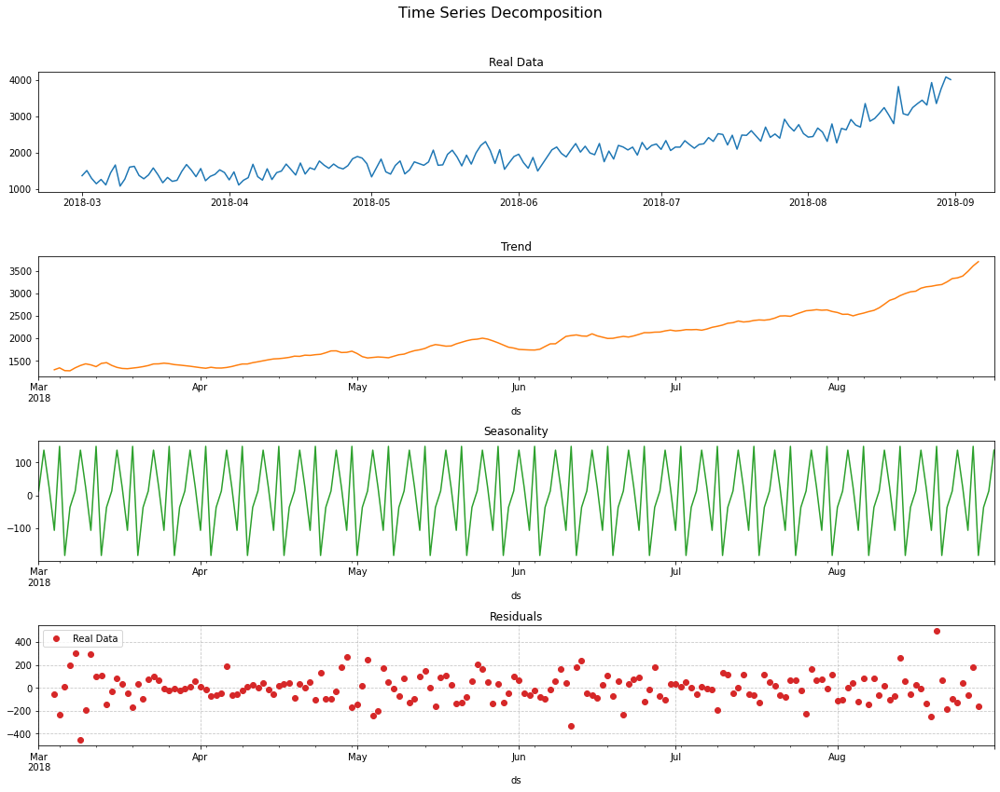

In [25]:
# Set a custom color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Set a custom line style for the Trend and Seasonality plots
line_styles = ['-', '--', '-', '--']

# Set a custom marker for the Residuals plot
marker_style = 'o'

# Create a figure with custom size
plt.figure(figsize=(15, 12))

# Real Data Plot
plt.subplot(411)
plt.plot(daily, color=colors[0])
plt.title('Real Data')

# Trend Plot
plt.subplot(412)
decomposed.trend.plot(ax=plt.gca(), linestyle=line_styles[0], color=colors[1])
plt.title('Trend')

# Seasonality Plot
plt.subplot(413)
decomposed.seasonal.plot(ax=plt.gca(), linestyle=line_styles[2], color=colors[2])
plt.title('Seasonality')

# Residuals Plot
plt.subplot(414)
decomposed.resid.plot(ax=plt.gca(), marker=marker_style, linestyle='None', color=colors[3])
plt.title('Residuals')

# Add custom legend for better understanding
plt.legend(['Real Data', 'Trend', 'Seasonality', 'Residuals'], loc='upper left')

# Add a grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Add a title to the entire visualization
plt.suptitle('Time Series Decomposition', fontsize=16)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot
plt.show()

## Train-Test Split <a id='split'></a>

The data for each model is different because the adjustment of data seasonality in LR model is done by the data, but in Prophet is adjust in parameter.

**FOR LINIEAR REGRESSION**

In [26]:
# Calculate the index to split the data
split_index = int(len(hourly) * 0.9)

In [27]:
# Split the data
train_data = data_hour.head(split_index)
test_data = data_hour.tail(len(data_hour) - split_index)

# Display the lengths of the train and test sets
print("Training set size:", len(train_data))
print("Testing set size:", len(test_data))

Training set size: 3974
Testing set size: 442


**FOR PROPHET**

In [49]:
# Calculate the index to split the data
split_index2 = int(len(data) * 0.1)

In [51]:
# Split the data
train = data.iloc[:len(data)-split_index2]
test = data.iloc[len(data)-split_index2:]

# Display the lengths of the train and test sets
print("Training set size:", len(train))
print("Testing set size:", len(test))

Training set size: 23847
Testing set size: 2649


## Modelling <a id='modelling'></a>

### Liniear Regression <a id='lr'></a>

In [40]:
# Extract features and target variable
X_train = train_data.drop('y', axis=1).reset_index()
X_train = X_train.values.astype(np.int64).reshape(-1, 1)
y_train = train_data['y']

X_test = test_data.drop('y', axis=1).reset_index()
X_test =  X_test.values.astype(np.int64).reshape(-1, 1)
y_test = test_data['y']

In [41]:
# Train the linear regression model
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [42]:
# Make predictions to train_data
yt_pred_lr = lr.predict(X_train)

# Evaluate using RMSE
rmse_lr_train = mean_squared_error(y_train, yt_pred_lr)**0.5
print("Root Mean Squared Error (RMSE) for Train Data:", rmse_lr_train)

Root Mean Squared Error (RMSE) for Train Data: 34.474032286515005


In [43]:
# Make predictions
y_pred_lr = lr.predict(X_test)

# Evaluate using RMSE
rmse_lr = mean_squared_error(y_test, y_pred_lr)**0.5
print("Root Mean Squared Error (RMSE) for Test Data:", rmse_lr)

Root Mean Squared Error (RMSE) for Test Data: 64.36020595670692


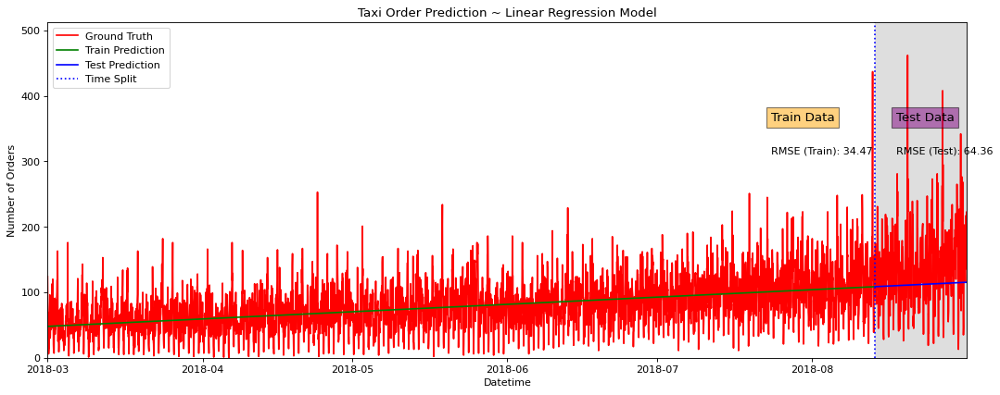

In [45]:
# Plotting
fig = plt.figure(figsize=(16, 6), dpi=80)

df_draw = pd.concat([train_data, test_data])

plt.plot(df_draw.index, df_draw['y'], color='r', label='Ground Truth')
plt.plot(train_data.index, yt_pred_lr, color='g', label='Train Prediction')
plt.plot(test_data.index, y_pred_lr, color='b', label='Test Prediction')

plt.axvline(train_data.index[-1], ls=':', color='b', label='Time Split')
plt.xlabel('Datetime')
plt.ylabel('Number of Orders')
plt.title('Taxi Order Prediction ~ Linear Regression Model')

plt.xlim(df_draw.index[0], df_draw.index[-1])
plt.ylim(0, df_draw['y'].max() + 50)

plt.axvspan(train_data.index[-1], df_draw.index[-1], facecolor='0.75', alpha=0.5)

plt.text(train_data.index[-1] - pd.Timedelta(hours=500), df_draw['y'].max() - 100, 'Train Data', fontsize=12, bbox=dict(facecolor='orange', alpha=0.5))
plt.text(train_data.index[-1] + pd.Timedelta(hours=100), df_draw['y'].max() - 100, 'Test Data', fontsize=12, bbox=dict(facecolor='purple', alpha=0.5))
plt.text(train_data.index[-1] - pd.Timedelta(hours=500), df_draw['y'].max() - 150, 'RMSE (Train): {:.2f}'.format(rmse_lr_train), fontsize=10)
plt.text(train_data.index[-1] + pd.Timedelta(hours=100), df_draw['y'].max() - 150, 'RMSE (Test): {:.2f}'.format(rmse_lr), fontsize=10)

plt.legend()
plt.show()

**Interpretation:**

Training Performance (RMSE 34.47), the model demonstrated good predictive accuracy on the training data, achieving a low RMSE. This indicates that the model was able to capture the underlying patterns and relationships present in the training set. But in the testing performance (RMSE 64.36)this is a common indication of overfitting and oversimplified of the data pattern.

**Implications:**

Overfitting occurs when a model learns the training data too well, including its noise and fluctuations, leading to poor generalization on new, unseen data. Exploring more complex models, such as Prophet designed for time series forecasting, could potentially capture feature problems well.

### Prophet  <a id='prophet'></a>

In [77]:
# Define the evaluation function
def evaluation (actual, predict):
    error = round(rmse(actual, predict), 2)
    mae = round(np.mean(abs(actual - predict)), 2)

    print("Root Mean Squared Error between actual and predicted values:", error)
    print("Mean Absolute Error between actual and predicted values:", mae)

In [52]:
# Initiate model and fitting with the data
model_prophet = Prophet()
model_prophet.fit(train)

02:25:07 - cmdstanpy - INFO - Chain [1] start processing
02:25:12 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
# Define a function to identify midnight and non-midnight
def is_midnight(ds):
    time = pd.to_datetime(ds).time()
    return 23 <= time.hour or time.hour <= 3  

train['midnight'] = train['ds'].apply(is_midnight)
train['non_midnight'] = ~train['ds'].apply(is_midnight)

In [ ]:
# Define a function to identify Saturday and Monday
def is_saturday_or_monday(ds):
    return pd.to_datetime(ds).dayofweek in [0, 5]

train['sat_mon'] = train['ds'].apply(is_saturday_or_monday)

In [324]:
# Create model adjusted
model_adjust = Prophet(daily_seasonality=True,
                       seasonality_mode='multiplicative'
                      )

In [325]:
# Add additional seasonality
model_adjust.add_seasonality(name='daily_midnight', period=1, fourier_order=5, condition_name='midnight', prior_scale=1)
model_adjust.add_seasonality(name='daily_non_midnight', period=1, fourier_order=5, condition_name='non_midnight')
model_adjust.add_seasonality(name='weekly_saturday_monday', period=7, fourier_order=3, condition_name='sat_mon', prior_scale=0.5)

In [326]:
model_adjust.fit(train)

05:22:09 - cmdstanpy - INFO - Chain [1] start processing
05:22:22 - cmdstanpy - INFO - Chain [1] done processing


In [327]:
# Create dataframe of dates for prediction
future2 = model_adjust.make_future_dataframe(periods=len(test), freq = '10T')

In [328]:
# Apply the same midnight and non-midnight conditions to future data
future2['midnight'] = future2['ds'].apply(is_midnight)
future2['non_midnight'] = ~future2['ds'].apply(is_midnight)
future2['sat_mon'] = future2['ds'].apply(is_saturday_or_monday)

In [329]:
# Predict
forecast2 = model_adjust.predict(future2)

In [332]:
# Create the plot of the predictions
plot_plotly(model_adjust, forecast2)

In [330]:
# Get prediction data to compare with test
predictions2 = forecast2.iloc[-len(test):]['yhat']

In [331]:
# Evaluation Metrics
evaluation(test['y'], predictions2)

Root Mean Squared Error between actual and predicted values: 10.5
Mean Absolute Error between actual and predicted values: 7.47


In [333]:
predictions_training2 = forecast2.iloc[:-len(test)]['yhat']

In [334]:
evaluation(train['y'], predictions_training2)

Root Mean Squared Error between actual and predicted values: 6.26
Mean Absolute Error between actual and predicted values: 4.77


As we can see in the latest model that conducting improvement information to the model resulting increase performace from RMSE 34 in Linear Regression to 10.5 in Prophet Meta using test data.

# Conclusions <a id='conclusions'></a>

In conclusion, the Prophet time series model has proven to be a robust choice for predicting airport taxi orders. Several factors contribute to its strong performance:

**1. Robust Handling of Time-Series Characteristics:**

Seasonality: Prophet excels at capturing complex seasonal patterns in the data, making it well-suited for modeling hourly taxi order trends.

Stationarity: The model inherently handles non-stationary data, removing the need for manual differencing or transformations.

**2. Flexibility and Adaptability:**

Shock Absorption: Prophet is designed to handle sudden shocks or outliers in the data effectively. This capability is crucial for accommodating immediate surges in taxi orders, such as unexpected spikes in demand.

**3. Parameter Tuning for Enhanced Accuracy:**

While Prophet demonstrates strong performance with default parameters, further improvements can be achieved by fine-tuning specific parameters. Incorporating special events or specifying peak hours can enhance the model's accuracy, particularly in capturing immediate flood orders or other time-sensitive phenomena with high accuracy.